<a href="https://colab.research.google.com/github/cmnemoi/ProjetDataScienceLPSID/blob/EDA/src/EDA.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Projet Data Science - Analyse exploratoire
### Enzo Risbetz et Charles-Meldhine Madi Mnemoi

Dans ce notebook, nous allons analyser le dataset (distribution des variables, liens entre elles...) pour identifier et créer des 
variables intéressantes pour la prédiction du prix de la course de taxis.



### Importation des packages et des données

In [1]:
!pip install pandas-profiling==2.13 -q
!pip install statsmodels --upgrade -q

     |████████████████████████████████| 245 kB 14.7 MB/s 
     |████████████████████████████████| 63 kB 1.3 MB/s 
     |████████████████████████████████| 102 kB 38.9 MB/s 
     |████████████████████████████████| 4.7 MB 45.6 MB/s 
     |████████████████████████████████| 690 kB 39.2 MB/s 
     |████████████████████████████████| 812 kB 24.0 MB/s 
     |████████████████████████████████| 38.1 MB 12.1 MB/s 
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
google-colab 1.0.0 requires requests~=2.23.0, but you have requests 2.27.1 which is incompatible.
datascience 0.10.6 requires folium==0.2.1, but you have folium 0.8.3 which is incompatible.
albumentations 0.1.12 requires imgaug<0.2.7,>=0.2.5, but you have imgaug 0.2.9 which is incompatible.
     |████████████████████████████████| 9.8 MB 28.1 MB/s 


In [34]:
import math
import datetime

import numpy as np
import pandas as pd

from scipy import stats

import statsmodels.api as sm
from statsmodels.formula.api import ols

import matplotlib.pyplot as plt
import seaborn as sns
from plotly import express as px
sns.set()

from pandas_profiling import ProfileReport



In [3]:
data = pd.read_csv("https://raw.githubusercontent.com/cmnemoi/ProjetDataScienceLPSID/main/data/cleaned_dataset.csv")

In [4]:
data.head()

,VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,RatecodeID,store_and_fwd_flag,PULocationID,DOLocationID,payment_type,total_amount,PULocationLabel,DOLocationLabel
0,1.0,2020-05-01 00:23:21,2020-05-01 00:26:01,2.0,0.4,1.0,N,264,264,1.0,5.80,NV,NV
1,1.0,2020-05-01 00:54:58,2020-05-01 00:57:11,1.0,0.3,1.0,N,264,264,2.0,4.80,NV,NV
2,1.0,2020-05-01 00:07:10,2020-05-01 00:12:46,1.0,1.7,1.0,N,107,229,2.0,10.80,Gramercy,Sutton Place/Turtle Bay North
3,1.0,2020-05-01 00:09:46,2020-05-01 00:27:44,1.0,2.9,1.0,N,79,237,2.0,15.80,East Village,Upper East Side South
4,1.0,2020-05-01 00:22:48,2020-05-01 00:28:58,1.0,1.5,1.0,N,140,263,1.0,12.95,Lenox Hill East,Yorkville West


Commençons par un premier aperçu à l'aide de Pandas Profiling :

In [5]:
pandas_report = ProfileReport(data, title="Pandas Profiling Report", explorative=True)
pandas_report.to_notebook_iframe()

Summarize dataset:   0%|          | 0/26 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Plusieurs observations :
 - `trip_distance` est très correlée à `total_amount`, ce sera une variable clé pour prédire le prix de la course.
 - Les variables `RatecodeID` et `payment_type` sont modéremment correlées à `total_amount`, elles peuvent donc être utiles également.

### Liens entre les variables explicatives et `total_amount`

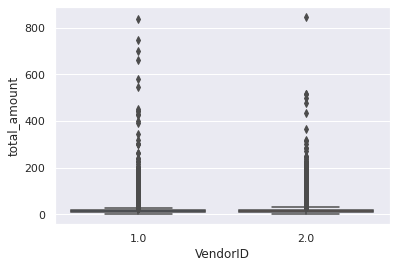

In [6]:
sns.boxplot(x=data["VendorID"], y=data["total_amount"])

La societé de taxis ne semblent pas influer sur le prix de la course.

 Les dates de début et fin de course n'ont pas été prises en compte par pandas profiling, codons les en datetime pour pouvoir les exploiter :

In [7]:
data["tpep_dropoff_datetime"] = pd.to_datetime(data["tpep_dropoff_datetime"])
data["tpep_pickup_datetime"] = pd.to_datetime(data["tpep_pickup_datetime"])

In [8]:
px.line(data_frame=data, x="tpep_dropoff_datetime", y="total_amount")

On observe des pics et des cycles intéressants. Essayons de grouper les données par intervalles de temps pour y voir plus clair :

In [9]:
def extract_thing_from_date(date_column, thing):
  l = []
  for date in date_column:
    l.append(getattr(date, thing))
    
  return l

In [11]:
#création des variables d'intervalles de temps
data["day"] = extract_thing_from_date(data["tpep_pickup_datetime"], "day")
data["weekday"] = data["tpep_pickup_datetime"].apply(datetime.datetime.weekday)
data["hour"] = extract_thing_from_date(data["tpep_pickup_datetime"], "hour")

[Text(0, 0.5, 'Prix moyen de la course (en $)'),
 Text(0.5, 0, 'Jour'),
 Text(0.5, 1.0, 'Répartition du prix moyen de la course en fonction du jour du mois')]

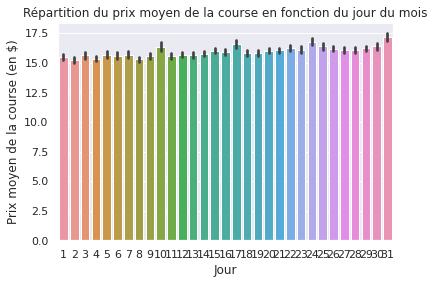

In [24]:
sns.barplot(data=data, x="day", y="total_amount").set(title="Répartition du prix moyen de la course en fonction du jour du mois", xlabel="Jour", ylabel="Prix moyen de la course (en $)")

On observe que le prix moyen m n'est pas uniforme selon les jours du mois. Utilisons une analyse de la variance (ANOVA) pour s'en assurer.

Soit mi le prix moyen des course lors du mois n°i.
 
Nous testons l'hypothèse nulle $\ H_0 : m_i = m_{i+1}, \ \forall i \ \epsilon \ [0;5[$ (les prix moyens sont identiques) 

contre l'hypothèse alternative $\ H_1 : \ \exists i, \ m_i \neq m_{i+1}$ (il existe au moins un prix moyen différent).


In [21]:
model = ols("total_amount ~ C(day)", data=data).fit()
anova_table = sm.stats.anova_lm(model, typ=2)
anova_table

,sum_sq,df,F,PR(>F)
C(day),4.496588e+04,30.0,10.142892,4.059381e-47
Residual,3.983474e+07,269564.0,NaN,NaN


D'après notre test, il y a environ 10^-44% de chances d'obtenir une telle distrubution dans la cadre de l'hypothèse nulle.
On rejette donc H0 avec une probabilité de 10^-44% de se tromper.

D'après notre test, certains jours du moins ont bien un effet sur le prix moyen de la course. On utilisera donc cette variable dans notre modèle.



[Text(0, 0.5, 'Prix moyen de la course (en $)'),
 Text(0.5, 0, 'Jour de la semaine (0 = lundi)'),
 Text(0.5, 1.0, 'Répartition du prix moyen de la course en fonction du jour de la semaine')]

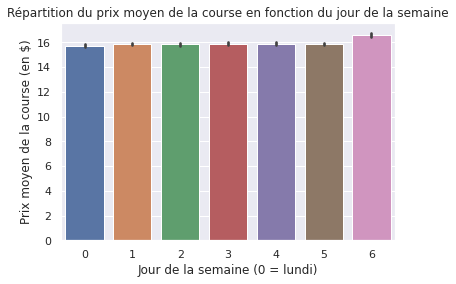

In [27]:
sns.barplot(data=data, x="weekday", y="total_amount").set(title="Répartition du prix moyen de la course en fonction du jour de la semaine", xlabel="Jour de la semaine (0 = lundi)", ylabel="Prix moyen de la course (en $)")

On observe que :    


1)  Le prix moyen semblent être le même du lundi au samedi.
 
2)  Le prix moyen semble être différent le dimanche.

Utilisons l'ANOVA pour tester 1).
Soit mi le prix moyen de la course pour i allant de 0 à 5.

Nous testons l'hypothèse nulle $\ H_0 : m_i = m_{i+1}, \ \forall i \ \epsilon \ [0;5[$ (les prix moyens sont identiques) 

contre l'hypothèse alternative $\ H_1 : \ \exists i, \ m_i \neq m_{i+1}$ (il existe au moins un prix moyen différent).




In [29]:
model = ols("total_amount ~ C(weekday)", data=data[data["weekday"] != 6]).fit()
anova_table = sm.stats.anova_lm(model, typ=2)
anova_table

,sum_sq,df,F,PR(>F)
C(weekday),5.715091e+02,5.0,0.784615,0.560545
Residual,3.485047e+07,239228.0,NaN,NaN


D'après notre test, il y a environ 56% d'obtenir une telle distribution dans le cadre de l'hypothèse nulle.
 
Cette probabilité est bien trop élevée, on ne peut donc rejeter l'hypothèse nulle : d'après notre test, les prix moyen du lundi au vendredi sont identiques.

On peut donc utiliser n'importe quel jour de la semaine pour effectuer un test de Student sur 2).

Soit m1 le prix moyen les autres jours de la semaine et m2 le prix moyen le dimanche.

Nous testons l'hypothèse nulle $\ H_0 : m_1 = m_{2}, \ \forall i \ \epsilon \ [0;5[$ (les prix moyens sont identiques) 

contre l'hypothèse alternative $\ H_1 : \ m_1 \neq m_{2}$ (les prix moyens sont différents).




In [36]:
stats.ttest_ind(a=data[data["weekday"] == 5]["total_amount"], b=data[data["weekday"] == 6]["total_amount"], alternative="two-sided")

Ttest_indResult(statistic=-7.280471426496609, pvalue=3.3627901720491143e-13)

D'après notre test il y a environ 10^-11% d'obtenir une telle différence dans le cadre de l'hypothèse nulle.

On rejette donc l'hypothèse nulle avec 10^-11% de se tromper : le prix moyen du dimanche est différent du prix moyen les autres jours de la semaine.

On créé donc une variable "is_Sunday" dans notre dataset :

In [42]:
data["is_sunday"] = data.apply(lambda x: 1 if x["weekday"] == 6 else 0, axis=1)

[Text(0, 0.5, 'Prix moyen de la course (en $)'),
 Text(0.5, 0, 'Heure'),
 Text(0.5, 1.0, "Répartition du prix moyen de la course en fonction de l'heure")]

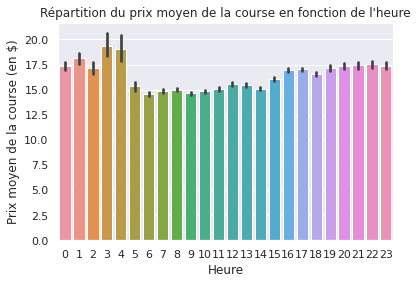

In [44]:
sns.barplot(data=data, x="hour", y="total_amount").set(title="Répartition du prix moyen de la course en fonction de l'heure", xlabel="Heure", ylabel="Prix moyen de la course (en $)")

On observe que le prix moyen m n'est pas uniforme selon les jours du mois. Utilisons une analyse de la variance (ANOVA) pour s'en assurer.

Soit mi le prix moyen des course lors du mois n°i.
 
Nous testons l'hypothèse nulle $\ H_0 : m_i = m_{i+1}, \ \forall i \ \epsilon \ [0;23[$ (les prix moyens sont identiques) 

contre l'hypothèse alternative $\ H_1 : \ \exists i, \ m_i \neq m_{i+1}$ (il existe au moins un prix moyen différent).

In [19]:
model = ols("total_amount ~ C(hour)", data=data).fit()
anova_table = sm.stats.anova_lm(model, typ=2)
anova_table

,sum_sq,df,F,PR(>F)
C(hour),2.950829e+05,23.0,87.370105,0.0
Residual,3.958462e+07,269571.0,NaN,NaN


D'après notre test, il y a environ 0% d'obtenir cette distribution dans le cadre de l'hypothèse nulle.

On la rejette donc avec une chance infime de se tromper : l'heure a une influence sur le prix de la course, on l'utilisera donc dans notre modèle.